In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
import seaborn as sns
from scipy.stats import spearmanr
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.pipeline import make_pipeline
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, FunctionTransformer, PowerTransformer, RobustScaler
#from sklearn.preprocessing import TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import LinearRegression, HuberRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin
import statsmodels.api as sm 
import pylab as py 
from scipy import stats
from sklearn.feature_selection import RFECV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.pipeline import Pipeline
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.cluster import HDBSCAN


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_excel("dataset.xlsx")
df.head()

,Quote_ID,Quote_Date,Driver1_DOB,Driver1_Licence_Type,Driver1_Licence_Years,Driver2_Licence_Type,Driver2_Licence_Years,Driver1_Convictions,Driver1_Claims,Driver1_Marital_Status,Vehicle_Age,Vehicle_Value,Tax,Vehicle_Annual_Mileage,Credit_Score,Payment_Type,Days_to_Inception,Premium,Capped_Premium
0,190537,2020-01-09 00:00:00,16/06/1959,Full UK,34,NaN,NaN,No,0,Married,4,24178,3626.70,12849,240,Monthly,11,707.64,707.64
1,161332,2020-06-01 00:00:00,1977-03-09 00:00:00,Full UK,12,NaN,NaN,No,2,Married,14,1744,174.40,1250,200,Annual,4,1176.96,1176.96
2,161666,21/07/2020,24/03/1990,Full UK,9,NaN,20.0,No,0,Married,5,20199,3029.85,21847,644,Annual,0,594.84,594.84
3,171589,2020-07-11 00:00:00,1980-11-03 00:00:00,Full UK,17,Full UK,NaN,No,2,Married,6,12569,1885.35,12266,548,Annual,0,1282.56,1282.56
4,154037,16/08/2020,17/09/1977,Full UK,25,Full UK,NaN,No,0,Separated,8,11395,1709.25,11117,393,Annual,30,1471.02,1471.02


In [4]:
df.shape

(50000, 19)

## Feature Exploration

- `Quote_ID` and `Quote_Date` are just identifiers of each row. They can possibly be dropped without losing much information. However, `Quote_Date` might capture any temporal trends of the premium values.
- `Driver1_DOB` might not be useful on its own but I can use it to find the driver's age at the time of the quote.
- The remaining are categorical and numerical features regarding the drivers and their vehicles.
- `Premium` is how much they were charged and will be my target variable.
- `Capped_Premium` is a cap on the premium. At this point, I assumed it would be correlated with the premium. I also didn't know what the policy regarding capping is so I didn't use this as my target variable. 

## Preliminary Data Cleaning

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Quote_ID                50000 non-null  int64  
 1   Quote_Date              50000 non-null  object 
 2   Driver1_DOB             50000 non-null  object 
 3   Driver1_Licence_Type    50000 non-null  object 
 4   Driver1_Licence_Years   50000 non-null  int64  
 5   Driver2_Licence_Type    32595 non-null  object 
 6   Driver2_Licence_Years   25614 non-null  float64
 7   Driver1_Convictions     50000 non-null  object 
 8   Driver1_Claims          50000 non-null  int64  
 9   Driver1_Marital_Status  50000 non-null  object 
 10  Vehicle_Age             50000 non-null  int64  
 11  Vehicle_Value           50000 non-null  int64  
 12  Tax                     50000 non-null  float64
 13  Vehicle_Annual_Mileage  50000 non-null  int64  
 14  Credit_Score            50000 non-null

- Only 2 columns contain missing values.
- There are 2 columns that are dates but not in the datetime dtype which I fix below.

In [6]:
# Converting date columns to datetime format
df.loc[df.Driver1_DOB.str.contains('/',na=False), 'Driver1_DOB'] = pd.to_datetime(df.loc[df.Driver1_DOB.str.contains('/',na=False), 'Driver1_DOB'],dayfirst=True)
df.loc[df.Quote_Date.str.contains('/',na=False), 'Quote_Date'] = pd.to_datetime(df.loc[df.Quote_Date.str.contains('/',na=False), 'Quote_Date'],dayfirst=True)

df.Driver1_DOB = pd.to_datetime(df.Driver1_DOB)
df.Quote_Date = pd.to_datetime(df.Quote_Date)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Quote_ID                50000 non-null  int64         
 1   Quote_Date              50000 non-null  datetime64[ns]
 2   Driver1_DOB             50000 non-null  datetime64[ns]
 3   Driver1_Licence_Type    50000 non-null  object        
 4   Driver1_Licence_Years   50000 non-null  int64         
 5   Driver2_Licence_Type    32595 non-null  object        
 6   Driver2_Licence_Years   25614 non-null  float64       
 7   Driver1_Convictions     50000 non-null  object        
 8   Driver1_Claims          50000 non-null  int64         
 9   Driver1_Marital_Status  50000 non-null  object        
 10  Vehicle_Age             50000 non-null  int64         
 11  Vehicle_Value           50000 non-null  int64         
 12  Tax                     50000 non-null  float6

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Quote_ID,50000.0,149964.738240,28890.771387,100000.00,124876.7500,150035.500,174990.250,199998.00
Driver1_Licence_Years,50000.0,19.661240,11.426496,0.00,11.0000,18.000,27.000,64.00
Driver2_Licence_Years,25614.0,21.978332,6.787247,0.00,17.0000,22.000,26.000,50.00
Driver1_Claims,50000.0,0.703980,1.027547,0.00,0.0000,0.000,2.000,6.00
Vehicle_Age,50000.0,-7.255280,414.791906,-9999.00,6.0000,9.000,13.000,75.00
Vehicle_Value,50000.0,6923.618640,6246.163977,-9999.00,2525.0000,5307.000,9620.000,50000.00
Tax,50000.0,891.406711,1174.513850,-9999.00,333.1000,706.125,1296.925,7500.00
Vehicle_Annual_Mileage,50000.0,5996.067800,9433.621696,-9999.00,1846.0000,3772.000,7742.750,200000.00
Credit_Score,50000.0,398.175700,229.783572,0.00,200.0000,397.000,597.000,799.00
Days_to_Inception,50000.0,7.310900,8.291635,0.00,1.0000,4.000,11.000,30.00


In [8]:
df.describe(include=['object']).T

,count,unique,top,freq
Driver1_Licence_Type,50000,4,Full UK,43761
Driver2_Licence_Type,32595,6,Full UK,27576
Driver1_Convictions,50000,3,No,44265
Driver1_Marital_Status,50000,10,Single,19004
Payment_Type,50000,2,Annual,26267


In [9]:
df[(df.Vehicle_Age < 0) | (df.Vehicle_Value < 0) | (df.Tax < 0) | (df.Vehicle_Annual_Mileage < 0)].shape

(951, 19)

`df.describe()` gave a better picture of the data. There are several columns with missing values or junk values.
- `Vehicle_Age`, `Vehicle_Value`, `Tax`, and `Vehicle_Annual_Mileage` contain a junk value of -9999. There are 951 such rows. To prevent loss of data, I can treat them as missing values and impute their values. 
- For the other two columns, `Driver2_Licence_Type` and `Driver2_Licence_Years`, there is a significant number of missing values. 
- From the table, I already notice that for several features, there is a large difference between the 75th percentile and the maximum value. So, I am expecting a large skew and possibly many outliers.

However, I will do this step after splitting the dataset into the training and test set to prevent data leakage.

I also checked the unique categories in each categorical column. I found that `Driver1_Marital_Status` contains two extra categories 'married' and 'single' so I cleaned that. `Driver1_Convictions` also contains a junk value that will have to be cleaned. For now, I replaced it with `np.nan`.

In [10]:
categorical = [var for var in df.columns if df[var].dtype=='O']

for column in categorical:
    print(column, df[column].unique())

Driver1_Licence_Type ['Full UK' 'Automatic' 'Provisional UK' 'Full EU/EEC']
Driver2_Licence_Type [nan 'Full UK' 'Automatic' 'Provisional UK' 'Full International'
 'Full Non EU/EEC' 'Full EU/EEC']
Driver1_Convictions ['No' 'Yes' -9999]
Driver1_Marital_Status ['Married' 'Separated' 'Widowed' 'Single' 'Other' 'Divorced' 'Common Law'
 'Civil Partnership' 'single' 'married']
Payment_Type ['Monthly' 'Annual']


In [11]:
df['Driver1_Marital_Status'] = np.where(df['Driver1_Marital_Status'] == "single", "Single", df['Driver1_Marital_Status'])
df['Driver1_Marital_Status'] = np.where(df['Driver1_Marital_Status'] == "married", "Married", df['Driver1_Marital_Status'])
df['Driver1_Convictions'] = np.where(df['Driver1_Convictions'] == -9999, np.nan, df['Driver1_Convictions'])
df['Vehicle_Age'] = np.where(df['Vehicle_Age'] < 0, np.nan, df['Vehicle_Age'])
df['Vehicle_Value'] = np.where(df['Vehicle_Value'] < 0, np.nan, df['Vehicle_Value'])
df['Vehicle_Annual_Mileage'] = np.where(df['Vehicle_Annual_Mileage'] < 0, np.nan, df['Vehicle_Annual_Mileage'])
df['Tax'] = np.where(df['Tax'] < 0, np.nan, df['Tax'])

for column in categorical:
    print(column, df[column].unique())

Driver1_Licence_Type ['Full UK' 'Automatic' 'Provisional UK' 'Full EU/EEC']
Driver2_Licence_Type [nan 'Full UK' 'Automatic' 'Provisional UK' 'Full International'
 'Full Non EU/EEC' 'Full EU/EEC']
Driver1_Convictions ['No' 'Yes' nan]
Driver1_Marital_Status ['Married' 'Separated' 'Widowed' 'Single' 'Other' 'Divorced' 'Common Law'
 'Civil Partnership']
Payment_Type ['Monthly' 'Annual']


## Adding some features

In [12]:
df['Driver1_Age'] = (df.Quote_Date - df.Driver1_DOB)/np.timedelta64(1,'Y')

## Train Test Split

My assumption when splitting the dataset was that Payment Type (Annual or Monthly) would affect the value of the Premium so I split after stratifying the dataset to ensure they were equally split between the training and testing sets.

In [136]:
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df["Payment_Type"], random_state=42)

In [14]:
train_df["Payment_Type"].value_counts()/len(train_df)

Annual     0.52535
Monthly    0.47465
Name: Payment_Type, dtype: float64

In [15]:
test_df["Payment_Type"].value_counts()/len(test_df)

Annual     0.5253
Monthly    0.4747
Name: Payment_Type, dtype: float64

## Exploratory Data Analysis

In [16]:
id_columns = ["Quote_ID", "Driver1_DOB", "Quote_Date"]
numerical = [column for column in train_df.columns if column not in id_columns and column not in categorical]

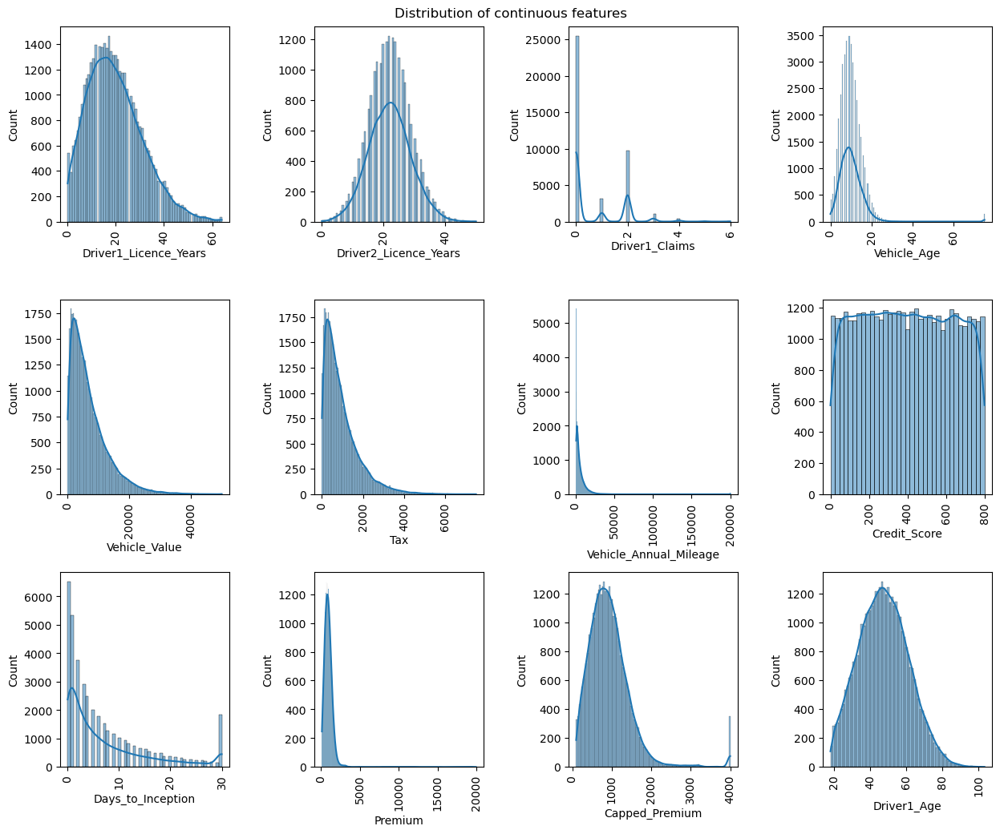

In [17]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.4,wspace=0.5)
plt.suptitle("Distribution of continuous features", fontsize=12, y=0.9)

for n,col in zip(range(len(numerical)),numerical):
    ax = plt.subplot(3, 4, n + 1)
    sns.histplot(data=train_df, x=col, kde=True,ax=ax)
    ax.tick_params(axis='x',labelrotation=90)
plt.show()

I looked at how the numerical variables were distributed. Features such as `Driver2_Licence_Years` and `Driver1_Age` had a pretty normal ditribution. However, the remaining features such as the ones regarding the vehicle, `days_to_inception` and `Premium` were heavily right skewed with heavy tails. This would be a poblem for models like linear regression which wouldn't be too robust with such skewed features. The logarithmic transformation might be able to fix them so I applied the log transformation below to see its affect.

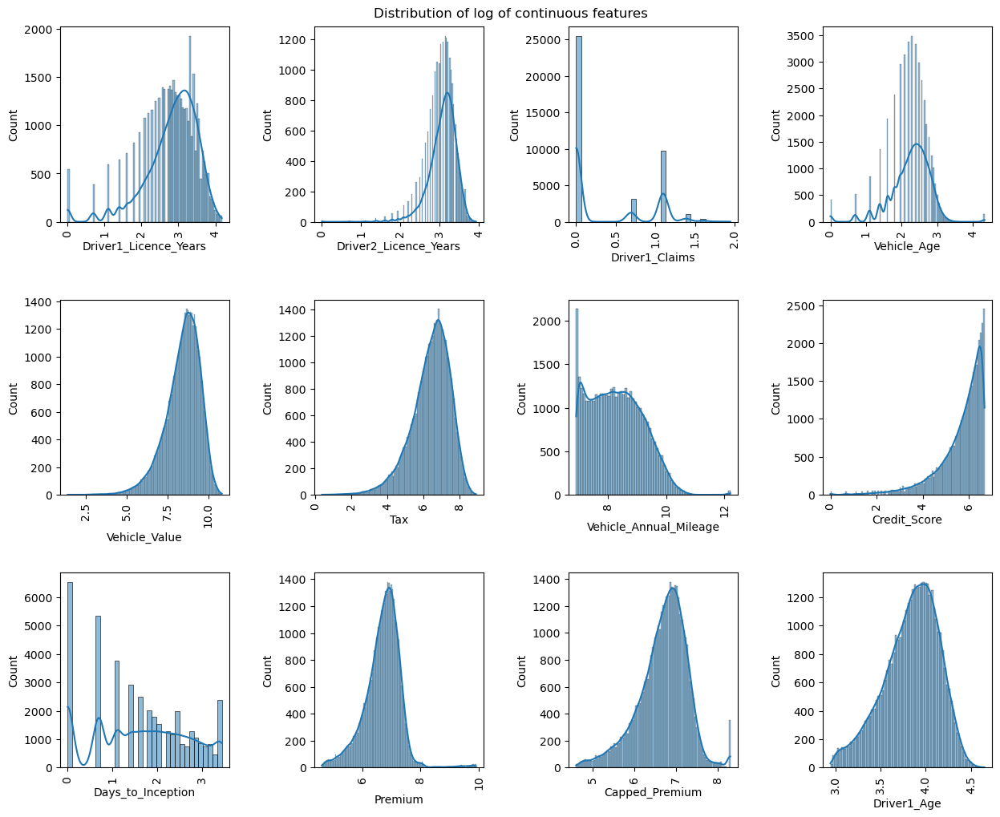

In [18]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.4,wspace=0.5)
plt.suptitle("Distribution of log of continuous features", fontsize=12, y=0.9)

for n,col in zip(range(len(numerical)),numerical):
    ax = plt.subplot(3, 4, n + 1)
    sns.histplot(data=train_df, x=np.log1p(train_df[col]), kde=True,ax=ax)
    ax.tick_params(axis='x',labelrotation=90)
plt.show()

The logarithmic transformation did make the skewed distributions slightly more normally distributed but they are still quite skewed. 

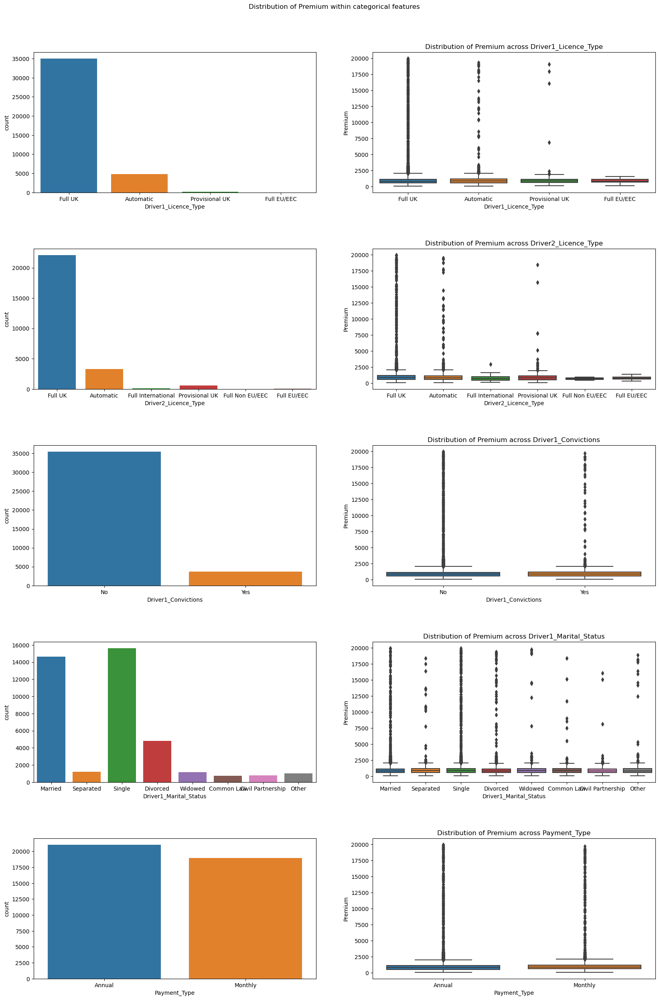

In [165]:
plt.figure(figsize=(20, 30))
plt.subplots_adjust(hspace=0.4,wspace=0.2)
plt.suptitle("Distribution of Premium within categorical features", fontsize=12, y=0.92)

for n,col in zip(range(1,2*len(categorical),2),[(col,col) for col in categorical]):
    ax = plt.subplot(5, 2, n)
    sns.countplot(data=train_df,x=col[0],ax=ax)
    ax = plt.subplot(5, 2, n + 1)
    sns.boxplot(data=train_df, y="Premium", x=col[1],ax=ax)
    ax.set_title("Distribution of Premium across " + col[0])
plt.show()

I looked at the count of each class within each categorical feature. I also looked at how the `Premium` values were distributed within each category. 
- Although the classes are imbalanced within each category, the distribution of premium is almost the same across all classed. 
- Also, within each class, there are several outliers with respect to `Premium`. So, there isn't any particular class that the large `Premium` values can be attributed to.

This motivated me to then analyze these outliers separately. I did not consider dropping them since as far as I know, they are valid `Premium` quotes and not just random noise in the data. I could have use `Capped_Premium` since it is the same as applying a cap on the outliers, however, I did not do that because I wasn't aware of the exact capping policy.

## Outlier Analysis

I first categorized the outliers in the `Premium` using the IQR. 

In [88]:
percentile25 = train_df['Premium'].quantile(0.25)
percentile75 = train_df['Premium'].quantile(0.75)

iqr = percentile75 - percentile25
upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

print(upper_limit)
print(lower_limit)

2071.2112499999766
-300.9787499999875


In [89]:
train_df["outlier"] = np.where(train_df['Premium'] < upper_limit, 0, 1)

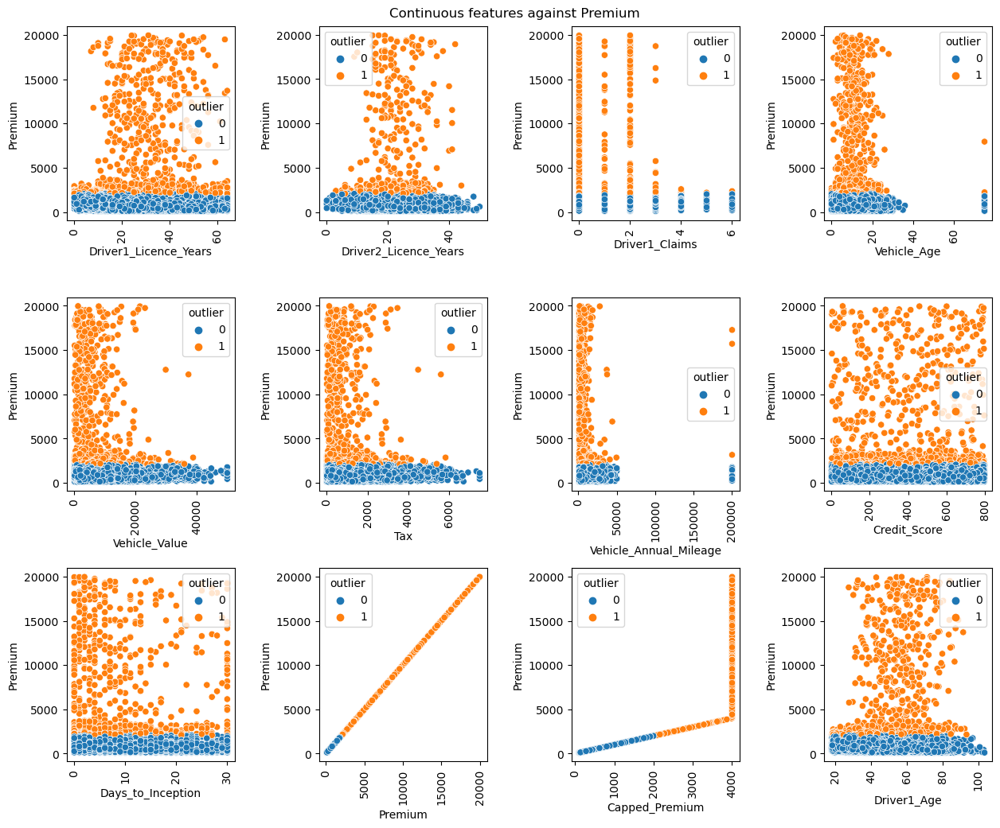

In [22]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.4,wspace=0.5)
plt.suptitle("Continuous features against Premium", fontsize=12, y=0.9)

for n,col in zip(range(len(numerical)),numerical):
    ax = plt.subplot(3, 4, n + 1)
    sns.scatterplot(data=train_df, x=col, y='Premium',hue='outlier',ax=ax)
    ax.tick_params(axis='x',labelrotation=90)
plt.show()

The plots above plot each numerical feature against the `Premium` with the outliers highlighted in orange. As seen above, there isn't any particular feature with which the outliers in the `Premium` are correlated. They occur almost randomly across all values in each numerical feature. This motivated me to plot the features against each other in a `sns.pairplot` to see if any two features cluster the instances in a way that corresponds to the outliers.

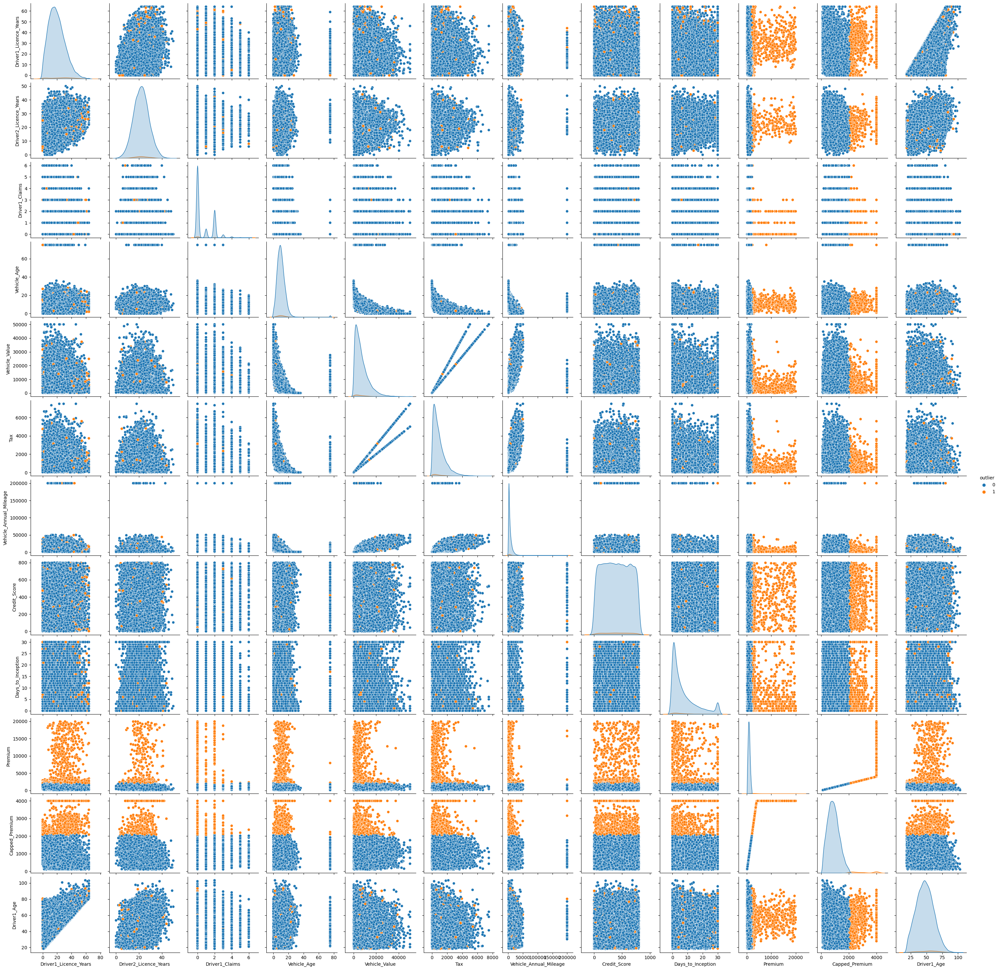

In [23]:
sns.pairplot(data=train_df, kind='scatter', hue="outlier", vars=numerical)

- As shown in the pairplots above, there isn't any pair of features that clusters out the outliers naturally. 
- The outliers and inliers are both following the same distribution in each feature combination.

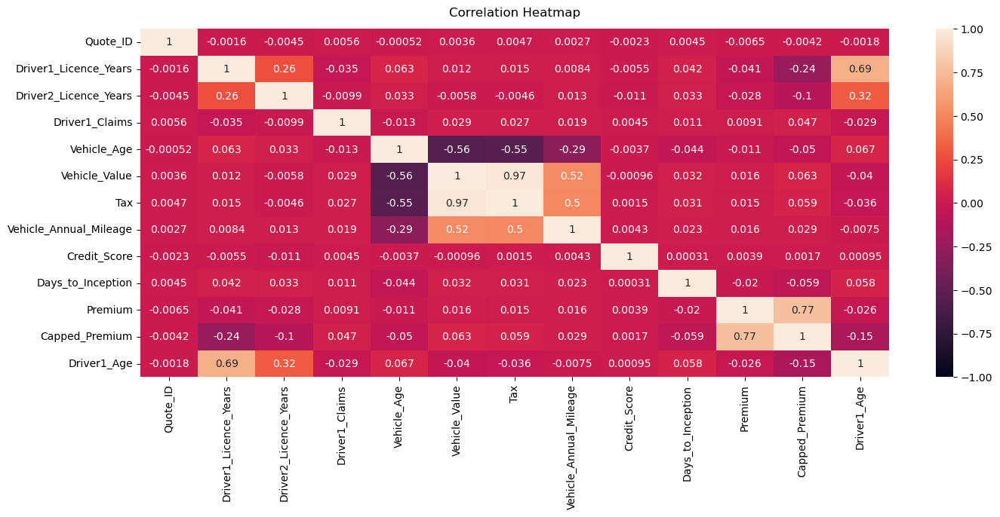

In [135]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(train_df.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

I also looked at the correlations between features so that I would have this information at hand later when selecting features. The features are negligbly correlated with each other except some:
- `Driver1_Licence_Years` and `Driver1_Age` is highly correlated which is to be expected.
- `Tax` is simply a percentage of `Vehicle_Value` so they are also correlated.
- `Vehicle_Age` and `Vehicle_Annual_Mileage` have a slight negative correlation.
- `Vehicle_Value` and `Vehicle_Age` are also moderately correlated.

## Clustering

At this point, I tried clustering the data. My hope was that taking all features into account, there might exist clusters which correlated with the `Premium`. I could then treat the cluster as an ordinal feature. I used HDBSCAN for this since it is a density-based clustering alogirthm, it does not require circular clusters, it is scale invariant and the number of clusters do not need to be specified.  

In [78]:
cluster_df = train_df[numerical].drop(['Tax','Premium','Capped_Premium'],axis=1).copy()

In [79]:
hdb = HDBSCAN(min_cluster_size=20)
hdb.fit(cluster_df)
hdb.labels_

array([-3,  0, -3, ...,  0, -3, -3])

In [80]:
cluster_df['cluster'] = hdb.labels_

In [81]:
cluster_df['cluster'].unique()

array([-3,  0,  1])

In [82]:
cluster_df = pd.concat([cluster_df, train_df["Premium"]], axis=1)

In [83]:
cluster_df.columns

Index(['Driver1_Licence_Years', 'Driver2_Licence_Years', 'Driver1_Claims',
       'Vehicle_Age', 'Vehicle_Value', 'Vehicle_Annual_Mileage',
       'Credit_Score', 'Days_to_Inception', 'Driver1_Age', 'cluster',
       'Premium'],
      dtype='object')

<Axes: xlabel='cluster', ylabel='Premium'>

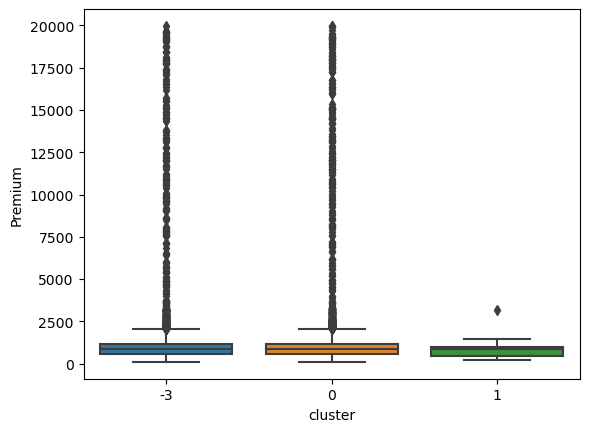

In [84]:
sns.boxplot(data=cluster_df, x="cluster", y="Premium")

<Axes: xlabel='cluster', ylabel='count'>

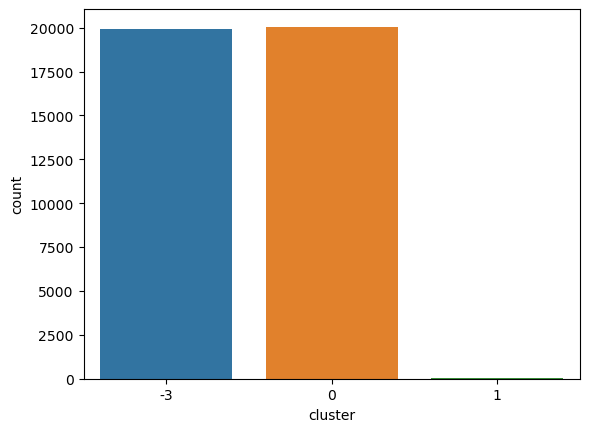

In [85]:
sns.countplot(cluster_df, x="cluster")

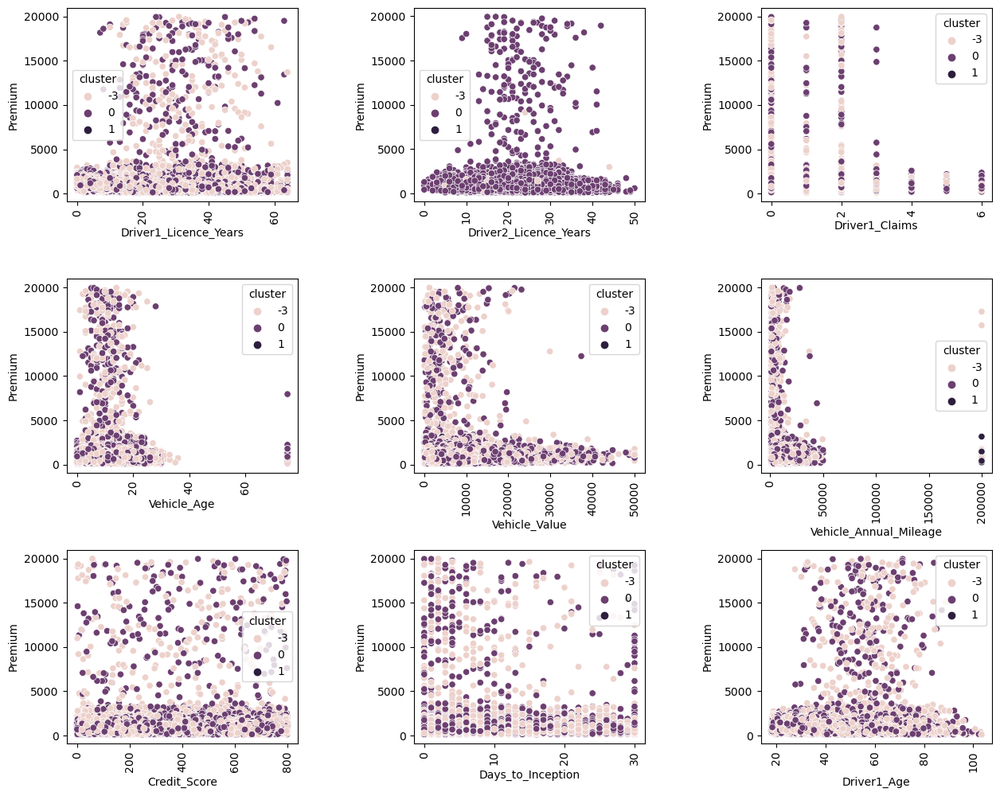

In [86]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.4,wspace=0.5)

cluster_columns = [col for col in cluster_df.columns if col != 'cluster' and col != 'Premium']
for n,col in zip(range(len(cluster_columns)),cluster_columns):
    ax = plt.subplot(3, 3, n + 1)
    sns.scatterplot(data=cluster_df, x=col, y='Premium',hue='cluster',ax=ax)
    ax.tick_params(axis='x',labelrotation=90)
plt.show()

Unfortunately, this line of reasoning was not very fruitful. HDBSCAN recognized three clusters. 
- Cluster 1 had very minimum instances in it. 
- Cluster 0 and cluster -3 had the majority of instances. However, as shown by the box plots they did not correlate with `Premium` which is distributed the same across both.
- This would just become another unnecessary categorical feature so I did not end up using it.

## Preprocessing pipelines

I built preprocessing pipelines so that modelling would be easier.
- For the numerical features, I imputed the missing values with the median. I did not use IterativeImputer or the mean since both are sensitive to outliers and the features are heavily skewed.
- For the categorical features, I used the most frequent value to fill the missing values.
- I applied logarithmic transformation to the heavily skewed features.
- I scaled all numerical features using StandardScaler()
- I one hot encoded the categorical features.

In [90]:
train_df = train_df.drop(["Quote_ID",'Quote_Date','Driver1_DOB', 'Capped_Premium','outlier'],axis=1)
train_df.columns

Index(['Driver1_Licence_Type', 'Driver1_Licence_Years', 'Driver2_Licence_Type',
       'Driver2_Licence_Years', 'Driver1_Convictions', 'Driver1_Claims',
       'Driver1_Marital_Status', 'Vehicle_Age', 'Vehicle_Value', 'Tax',
       'Vehicle_Annual_Mileage', 'Credit_Score', 'Payment_Type',
       'Days_to_Inception', 'Premium', 'Driver1_Age'],
      dtype='object')

In [91]:
default_numerical_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
log_pipeline = make_pipeline(SimpleImputer(strategy="median"), FunctionTransformer(np.log1p, feature_names_out="one-to-one"),StandardScaler()) #
categorical_pipeline = make_pipeline(SimpleImputer(strategy="most_frequent"),OneHotEncoder(handle_unknown="ignore"))

I then created the training dataset and labels for training.

In [92]:
X_train = train_df.drop(["Premium","Tax"],axis=1)
y_train = train_df["Premium"].copy()

## Modelling

I experimented with several models. I built a simple regression model as a baseline although considering the outliers, I did not expect it to perform well. I also experimented with random forest regressor and gradient boosting machines, both of which are more robust to outliers due to their tree-based algorithms.

### Baseline Linear Regression Model

In [93]:
linear_reg_preprocessing = ColumnTransformer([
("log", log_pipeline, ["Vehicle_Value","Vehicle_Annual_Mileage","Vehicle_Age","Days_to_Inception"]),
("cat", categorical_pipeline, categorical)
],
remainder=default_numerical_pipeline)

In [94]:
model = TransformedTargetRegressor(LinearRegression(),func=np.log1p,inverse_func=np.expm1)

lin_reg = make_pipeline(linear_reg_preprocessing, model)
lin_reg.fit(X_train, y_train)
predictions = lin_reg.predict(X_train)

rmse = mean_squared_error(y_train,predictions,squared=False)
rmse

1254.2871707435625

In [95]:
r2 = r2_score(y_train,predictions)
r2

-0.02332718751471652

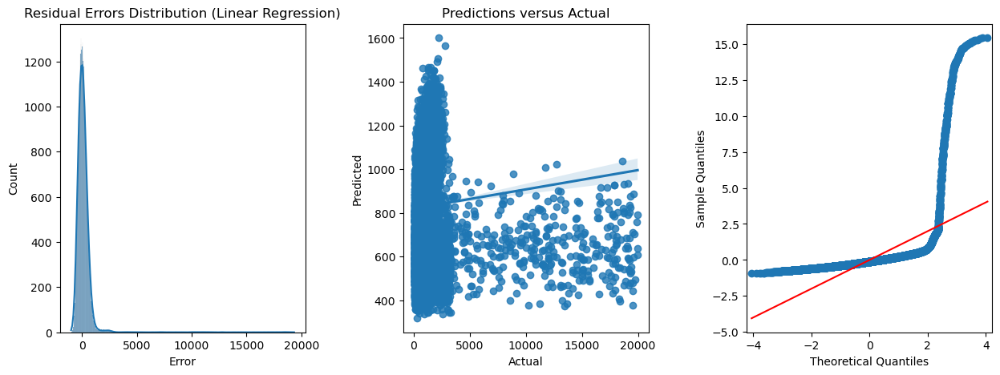

In [96]:
residuals = y_train - predictions

fig,axes = plt.subplots(1,3,figsize=(15,5))
plt.subplots_adjust(hspace=0.8,wspace=0.4)

sns.histplot(data=residuals, x=residuals, kde=True,ax=axes[0])
axes[0].set_xlabel("Error")
axes[0].set_title("Residual Errors Distribution (Linear Regression)")
plt.close()

sns.regplot(x=y_train, y=predictions,ax=axes[1])
axes[1].set_title("Predictions versus Actual")
axes[1].set_xlabel("Actual")
axes[1].set_ylabel("Predicted")
plt.close()

standardized_residuals = (residuals - residuals.mean())/residuals.std()
sm.qqplot(standardized_residuals, line ='s',ax=axes[2]) 


As expected, the RMSE on the training set alone is 1,254 and the R-squared is a measly -0.02. The outliers lead to very large residual errors, as shown by the histogram and Q-Q plot that increase the RMSE and the model does not explain the variance in the dataset. I wasn't expecting linear regression to work anyway, however, I still tried to see if performance could be improved by dropping unnecessary features. Hence, I performed feature selection using the wrapper method, recursive feature selection.

#### Feature Selection

In [97]:
X_prepared_fs = linear_reg_preprocessing.fit_transform(X_train)
X_prepared_fs = pd.DataFrame(X_prepared_fs, columns=linear_reg_preprocessing.get_feature_names_out(),index=X_train.index)

selector = RFECV(LinearRegression(), step=1, cv=5)
selector = selector.fit(X_prepared_fs, y_train)
selector.support_

array([ True, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True, False,
       False, False,  True,  True,  True,  True,  True, False,  True,
        True, False, False,  True])

In [98]:
X_feature_selected = pd.DataFrame(X_prepared_fs, columns=linear_reg_preprocessing.get_feature_names_out(),index=X_train.index)
for i,c in zip(selector.support_, X_feature_selected.columns):
    if i == False:
        X_feature_selected = X_feature_selected.drop(c,axis=1)

In [99]:
lin_reg_fs = LinearRegression()
lin_reg_fs.fit(X_feature_selected, y_train)
predictions = lin_reg_fs.predict(X_feature_selected)

rmse = mean_squared_error(y_train,predictions,squared=False)
rmse

1238.12156989476

After dropping features, performance on the training set improved marginally. However, this is just the training set. I did not perform cross validation here because even the training error was very high so the validation error would just be higher. So, I just moved onto a more promising algorithm.

### Random Forest Regressor

I then tried the Random Forest Regressor which due to its tree-based algorithm is more robust to outliers. Therefore, I did not log transform the features either. I had done it with log transformation but that had actually degraded performance so I chose to leave it out.

In [166]:
forest_preprocessing = ColumnTransformer([
("cat", categorical_pipeline, categorical)
],
remainder=default_numerical_pipeline)

In [167]:
forest_reg = make_pipeline(forest_preprocessing, RandomForestRegressor())
forest_reg.fit(X_train,y_train)
predictions = forest_reg.predict(X_train)

rmse = mean_squared_error(y_train,predictions,squared=False)
rmse

480.2471040254071

In [168]:
r2 = r2_score(y_train,predictions)
r2

0.8499796889883053

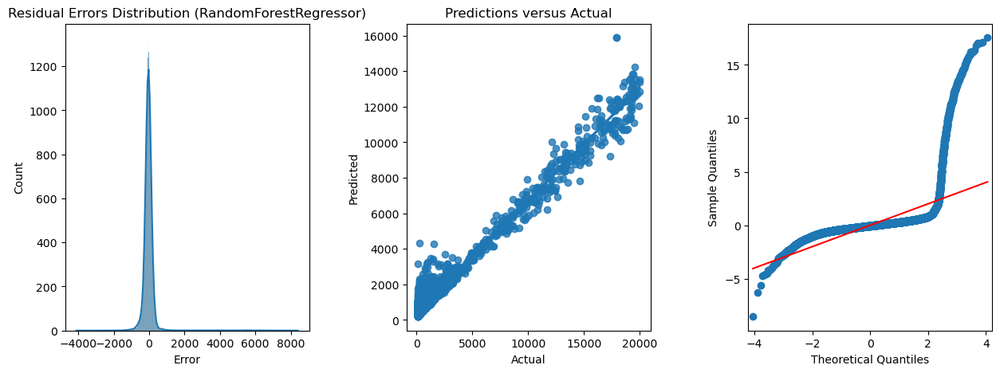

In [169]:
residuals = y_train - predictions

fig,axes = plt.subplots(1,3,figsize=(15,5))
plt.subplots_adjust(hspace=0.8,wspace=0.4)

sns.histplot(data=residuals, x=residuals, kde=True,ax=axes[0])
axes[0].set_xlabel("Error")
axes[0].set_title("Residual Errors Distribution (RandomForestRegressor)")
plt.close()

sns.regplot(x=y_train, y=predictions,ax=axes[1])
axes[1].set_title("Predictions versus Actual")
axes[1].set_xlabel("Actual")
axes[1].set_ylabel("Predicted")
plt.close()

standardized_residuals = (residuals - residuals.mean())/residuals.std()
sm.qqplot(standardized_residuals, line ='s',ax=axes[2]) 


The RMSE on the training set improved drastically compared to linear regression from >1,200 to 480 and the R-squared increased tp 85%. The residual errors are also much lower. However, as shown by the scatter plot, the model was overfitted and I expected performance to degrade drastically on the training set. Therefore, I used cross validation and the validation score to evaluate models below.

#### Feature Selection

I also confirmed if feature selection could improve performance. I used RandomForestRegressor's built in feature_importance attribute to drop features below a threshold of 0.025.

In [104]:
X_prepared_fs = forest_preprocessing.fit_transform(X_train)
X_prepared_fs = pd.DataFrame(X_prepared_fs, columns=forest_preprocessing.get_feature_names_out(),index=X_train.index)

forest_reg_fs = RandomForestRegressor()
forest_reg_fs.fit(X_prepared_fs, y_train)

RandomForestRegressor()

Text(0, 0.5, 'Mean decrease in impurity')

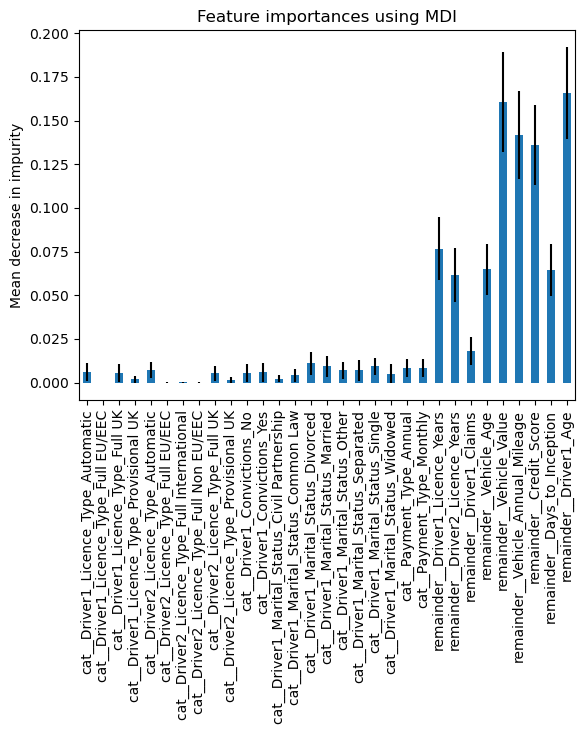

In [105]:
importances = forest_reg_fs.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_reg_fs.estimators_], axis=0)

forest_importances = pd.Series(importances, index=X_prepared_fs.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
#fig.tight_layout()

In [106]:
forest_importances = forest_importances.sort_values(ascending=0)
forest_importances = forest_importances[forest_importances > 0.025]

In [107]:
X_feature_selected = X_prepared_fs.copy()
for c in X_feature_selected.columns:
    if c not in forest_importances.index:
        X_feature_selected = X_feature_selected.drop(c,axis=1)
        
forest_reg_fs = RandomForestRegressor()
forest_reg_fs.fit(X_feature_selected, y_train)

rmse = mean_squared_error(y_train,predictions,squared=False)
rmse

475.17601432132994

This did not affect performance at all really, which makes sense since most categorical features are very sparse and also not correlated with Premium at all and these are the ones that were dropped. I could have dropped them entirely however they were not affecting performance either way so I chose to keep them while tuning hyperparamters.

#### Hyperparameter tuning & Cross Validation

I tuned hyperparameters using scikit-learn's randomized search feature. The best parameters are the ones that gave the lowest validation error.

In [108]:
param_distribs = {'random_forest__max_features': randint(low=2, high=20),
                  'random_forest__min_samples_leaf': randint(low=2, high=20),
                  'random_forest__bootstrap': [True,False],
                  'random_forest__n_estimators': randint(low=2, high=20),
                 }

full_forest_pipeline = Pipeline([
("preprocessing", forest_preprocessing),
("random_forest", RandomForestRegressor(random_state=42)),
])

In [109]:
rnd_forest_search = RandomizedSearchCV(full_forest_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,scoring='neg_root_mean_squared_error', random_state=42)

rnd_forest_search.fit(X_train, y_train)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                           SimpleImputer(strategy='median')),
                                                                                          ('standardscaler',
                                                                                           StandardScaler())]),
                                                                transformers=[('cat',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('onehotencoder',
                                                                                                OneHotEncoder(handle_unknown='ignore')...
                                        'random_forest__max_features': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000255095EA190>,
                                        'random_forest__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000025568FB8B90>,
                                        'random_forest__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000255096206D0>},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [110]:
rnd_forest_search.best_params_

{'random_forest__bootstrap': False,
 'random_forest__max_features': 2,
 'random_forest__min_samples_leaf': 13,
 'random_forest__n_estimators': 13}

In [111]:
cv_res = pd.DataFrame(rnd_forest_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_forest__bootstrap,param_random_forest__max_features,param_random_forest__min_samples_leaf,param_random_forest__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
4,0.407402,0.021559,0.036448,0.007366,False,2,13,13,"{'random_forest__bootstrap': False, 'random_fo...",-1267.642168,-1139.858663,-1306.294019,-1237.931617,71.120646,1
8,1.131961,0.037631,0.073655,0.014226,False,5,15,19,"{'random_forest__bootstrap': False, 'random_fo...",-1267.768115,-1142.771050,-1304.429118,-1238.322761,69.203104,2
3,0.457751,0.042945,0.047736,0.013840,False,3,13,7,"{'random_forest__bootstrap': False, 'random_fo...",-1269.810451,-1147.523760,-1306.748243,-1241.360818,68.044815,3
1,1.115855,0.134634,0.068353,0.010429,True,8,12,12,"{'random_forest__bootstrap': True, 'random_for...",-1273.033264,-1144.453871,-1310.330535,-1242.605890,71.054607,4
5,2.279757,0.076008,0.067705,0.019485,True,18,11,17,"{'random_forest__bootstrap': True, 'random_for...",-1275.463202,-1152.684777,-1308.572567,-1245.573515,67.058660,5


The best model gave a validation RMSE of 1,267 which is much better considering that was the training RMSE of linear regression.

### Gradient Boosting Machine

I then repeated the same process as above using XGBRegressor. This method is also robust to outliers. Although it gave a higher training RMSE than RandomForest with much larger residuals, I still tuned the hyperparameters and checked its performance on the validation set. I found that it performed marginally better on the validation set after hyperparameter tuning so I chose it as my best model.

In [118]:
boost_preprocessing = ColumnTransformer([
("cat", categorical_pipeline, categorical)
],
remainder=default_numerical_pipeline)

In [119]:
boost_reg = make_pipeline(boost_preprocessing, XGBRegressor())
boost_reg.fit(X_train, y_train)
predictions = boost_reg.predict(X_train)

rmse = mean_squared_error(y_train,predictions,squared=False)
rmse

831.8352459053026

In [120]:
r2 = r2_score(y_train,predictions)
r2

0.5499143276605339

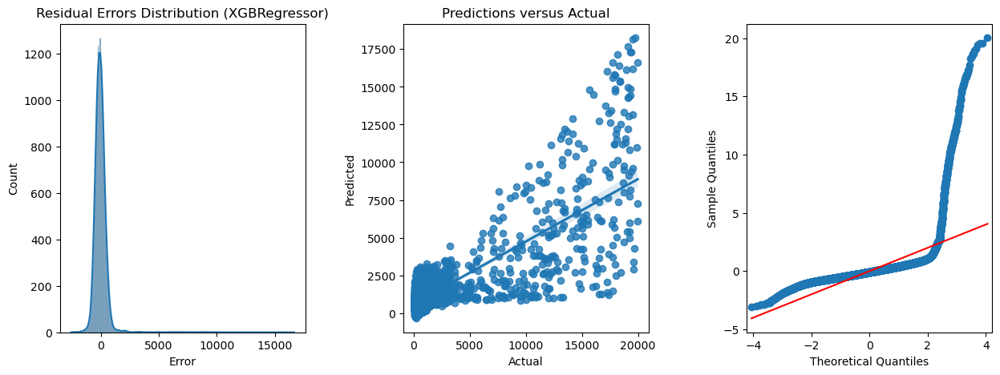

In [121]:
residuals = y_train - predictions

fig,axes = plt.subplots(1,3,figsize=(15,5))
plt.subplots_adjust(hspace=0.8,wspace=0.4)

sns.histplot(data=residuals, x=residuals, kde=True,ax=axes[0])
axes[0].set_xlabel("Error")
axes[0].set_title("Residual Errors Distribution (XGBRegressor)")
plt.close()

sns.regplot(x=y_train, y=predictions,ax=axes[1])
axes[1].set_title("Predictions versus Actual")
axes[1].set_xlabel("Actual")
axes[1].set_ylabel("Predicted")
plt.close()

standardized_residuals = (residuals - residuals.mean())/residuals.std()
sm.qqplot(standardized_residuals, line ='s',ax=axes[2]) 


#### Hyperparameter tuning

In [122]:
import random

param_distribs = {'boost__n_estimators': randint(low=2, high=5000),
                  'boost__learning_rate':[0.1,0.2,0.5],
                  'boost__min_child_weight': randint(low=1, high=10),
                  'boost__max_depth': randint(low=1, high=50),
                  'boost__max_delta_step': randint(low=0, high=20),
                  'boost__subsample':[0.1,0.2,0.5],
                  'boost__colsample_bytree':[0.1,0.2,0.5],
                  'boost__colsample_bylevel':[0.1,0.2,0.5]
                  }

full_boosting_pipeline = Pipeline([
("preprocessing", boost_preprocessing),
("boost", XGBRegressor(random_state=42)),
])

In [123]:
rnd_boosting_search = RandomizedSearchCV(full_boosting_pipeline, param_distributions=param_distribs, n_iter=10, cv=3,scoring='neg_root_mean_squared_error', random_state=42)

rnd_boosting_search.fit(X_train, y_train)

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                           SimpleImputer(strategy='median')),
                                                                                          ('standardscaler',
                                                                                           StandardScaler())]),
                                                                transformers=[('cat',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('onehotencoder',
                                                                                                OneHotEncoder(handle_unknown='ignore')...
                                        'boost__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000025568FAB790>,
                                        'boost__min_child_weight': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000254BFF19590>,
                                        'boost__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002556902C0D0>,
                                        'boost__subsample': [0.1, 0.2, 0.5]},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [124]:
rnd_boosting_search.best_params_

{'boost__colsample_bylevel': 0.2,
 'boost__colsample_bytree': 0.2,
 'boost__learning_rate': 0.2,
 'boost__max_delta_step': 9,
 'boost__max_depth': 36,
 'boost__min_child_weight': 8,
 'boost__n_estimators': 3800,
 'boost__subsample': 0.1}

In [125]:
cv_res = pd.DataFrame(rnd_boosting_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)
cv_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_boost__colsample_bylevel,param_boost__colsample_bytree,param_boost__learning_rate,param_boost__max_delta_step,param_boost__max_depth,param_boost__min_child_weight,param_boost__n_estimators,param_boost__subsample,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
8,5.192466,0.157114,0.131217,0.007672,0.2,0.2,0.2,9,36,8,3800,0.1,"{'boost__colsample_bylevel': 0.2, 'boost__cols...",-1261.136393,-1135.448265,-1303.422634,-1233.335764,71.337243,1
9,7.792718,0.660395,0.236990,0.016120,0.2,0.1,0.1,17,47,5,4889,0.2,"{'boost__colsample_bylevel': 0.2, 'boost__cols...",-1261.261608,-1136.686840,-1302.376045,-1233.441498,70.444763,2
3,2.966114,0.060311,0.109945,0.007380,0.2,0.1,0.1,16,27,3,1901,0.5,"{'boost__colsample_bylevel': 0.2, 'boost__cols...",-1261.741243,-1135.974980,-1303.068382,-1233.594868,71.059670,3
7,2.582162,0.234062,0.090829,0.009282,0.2,0.2,0.2,9,4,6,1502,0.5,"{'boost__colsample_bylevel': 0.2, 'boost__cols...",-1261.814004,-1135.938119,-1303.078570,-1233.610231,71.089485,4
6,2.902134,0.089335,0.091859,0.009184,0.5,0.1,0.5,2,14,1,1957,0.2,"{'boost__colsample_bylevel': 0.5, 'boost__cols...",-1262.011202,-1136.086960,-1303.622171,-1233.906778,71.224555,5


## Testing & Evaluation

In [126]:
test_df = test_df.drop(["Quote_ID",'Quote_Date','Driver1_DOB', 'Capped_Premium'],axis=1)
test_df.columns

Index(['Driver1_Licence_Type', 'Driver1_Licence_Years', 'Driver2_Licence_Type',
       'Driver2_Licence_Years', 'Driver1_Convictions', 'Driver1_Claims',
       'Driver1_Marital_Status', 'Vehicle_Age', 'Vehicle_Value', 'Tax',
       'Vehicle_Annual_Mileage', 'Credit_Score', 'Payment_Type',
       'Days_to_Inception', 'Premium', 'Driver1_Age'],
      dtype='object')

In [127]:
X_test = test_df.drop(["Premium","Tax"],axis=1)
y_test = test_df["Premium"].copy()

In [128]:
params = rnd_boosting_search.best_params_
params

{'boost__colsample_bylevel': 0.2,
 'boost__colsample_bytree': 0.2,
 'boost__learning_rate': 0.2,
 'boost__max_delta_step': 9,
 'boost__max_depth': 36,
 'boost__min_child_weight': 8,
 'boost__n_estimators': 3800,
 'boost__subsample': 0.1}

In [129]:
boost_reg = make_pipeline(boost_preprocessing, XGBRegressor(**params,random_state=42))
boost_reg.fit(X_train, y_train)
predictions = boost_reg.predict(X_train)

rmse = mean_squared_error(y_train,predictions,squared=False)
print("Train RMSE: ", rmse)

Train RMSE:  831.8352459053026


In [130]:
final_predictions = boost_reg.predict(X_test)

final_rmse = mean_squared_error(y_test, final_predictions, squared=False)
print("Test RMSE: ",final_rmse)

Test RMSE:  1292.0606585841344


In [131]:
confidence = 0.95
squared_errors = (final_predictions - y_test) ** 2
np.sqrt(stats.t.interval(confidence, len(squared_errors) - 1,loc=squared_errors.mean(),scale=stats.sem(squared_errors)))

array([1158.62816353, 1412.94807746])

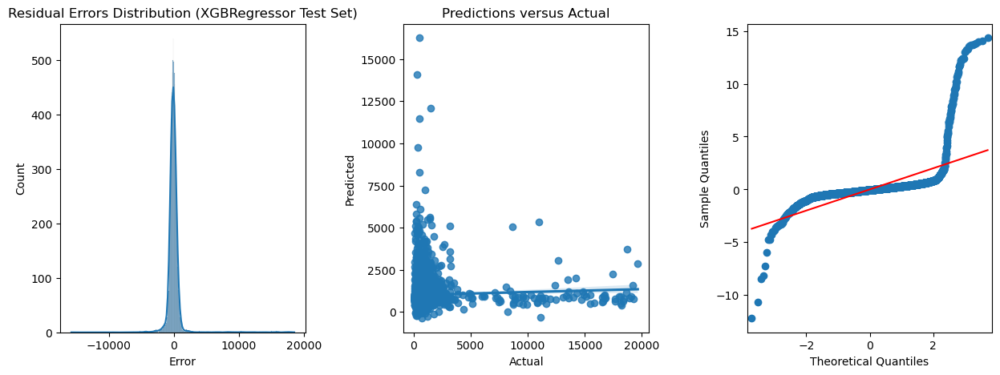

In [132]:
residuals = y_test - final_predictions

fig,axes = plt.subplots(1,3,figsize=(15,5))
plt.subplots_adjust(hspace=0.8,wspace=0.4)

sns.histplot(data=residuals, x=residuals, kde=True,ax=axes[0])
axes[0].set_xlabel("Error")
axes[0].set_title("Residual Errors Distribution (XGBRegressor Test Set)")
plt.close()

sns.regplot(x=y_test, y=final_predictions,ax=axes[1])
axes[1].set_title("Predictions versus Actual")
axes[1].set_xlabel("Actual")
axes[1].set_ylabel("Predicted")
plt.close()

standardized_residuals = (residuals - residuals.mean())/residuals.std()
sm.qqplot(standardized_residuals, line ='s',ax=axes[2])



#### Final Results

Since XGBRegressor gave the best performance on the validation set, I used that as my final model along with the set of hyperparameters that gave the best performance. 
It gave an RMSE of 1,292 on the test set with a 95% confidence interval around RMSE of 1,158 to 1,412. 
- Looking at the scatter plot of actual versus predicted values and the residual error distributions, the model is underestimating actual large `Premium` values and overestimating the low ones. This is in line with what we looked at in EDA, the `Premium` was not correlated with any particular feature and the outliers could not be explained by any of them. Hence, the model is not robust. 
- I also considered further ensembling models, and stacked the XGBRegressor model with the RandomForestRegressor. However, this greatly improved training time with barely any improvement in performance. So, ultimately, I chose the XGBRegressor.
- I could have also tried stacking XGBRegressor with other gradient boosting regressors to squeeze out more performance. However, I think it would be more fruitful to investigate the premium setting process to determine what is causing the outliers. Ultimately, dealing with outliers would be the greatest fix to performance.